In [1]:
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
from scipy import *
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

sys.path.append('/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence')
sys.path.append('/projects/DEIKE/cmartinb/functions')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
# Funciones y clases personalizadas
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 
import pylab
os.chdir('/projects/DEIKE/cmartinb/')

In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)


In [3]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p08' # 0p16 
uoc = '0p50' # 0p50 0p75
reW = '2.5e4' #1.0e5
reA = 720
maxLevel = 10
Bo=200

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

if uoc == '0p75':
    N = 1024
else:
    N = 512 

#Common parameters 
kp = 4
u = 0.25
lambdap = 2*m.pi/kp

L0 = 2*np.pi;


ak, cp, omegap, nu_water, g , uoc_val= calculate_parameters(kpHs, uoc , u ,kp)
print('ak is', ak, 'c is' ,cp, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)

ak is 0.08 c is 0.5 w_p$ is 2.0 $
u_w$ is 3.141592653589793e-05 g is 1 N 512


In [4]:
cp = np.sqrt(g/kp)
T0 = lambdap/cp
omegap = 2*m.pi/T0

In [5]:
work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
data = np.loadtxt(work_dir+'eta/global_int.out')
istep_c =data[:, 1]
time = data[:,0] 
print(time.shape)

(1731,)


In [6]:
tstart = time[0]

In [7]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
print(eta_series.shape)
print(time.shape)

(1731, 512, 512)
(1731,)


In [8]:
indice = np.argmax(omegap*(time - tstart) > 5)
print(indice)

eta_series_trimmed = eta_series[indice:, :]

print(eta_series_trimmed.shape)
time = time[indice:]

eta_series = eta_series_trimmed
print(time.shape)

26
(1705, 512, 512)
(1705,)


In [9]:
pressure_series = np.load(f'/projects/DEIKE/cmartinb/pressure/pressure_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
print(pressure_series.shape)
print(time.shape)

(1731, 512, 512)
(1705,)


In [10]:
pressure_series_trimmed = pressure_series[indice:, :]
print(pressure_series_trimmed.shape)
pressure_series = pressure_series_trimmed
print(time.shape)

(1705, 512, 512)
(1705,)


In [11]:
tstart = time[0]

In [12]:
print(time)

[2432.322544  2432.4207188 2432.5188936 ... 2599.4160033 2599.5141781
 2599.6123528]


In [13]:
print(omegap)

2.0


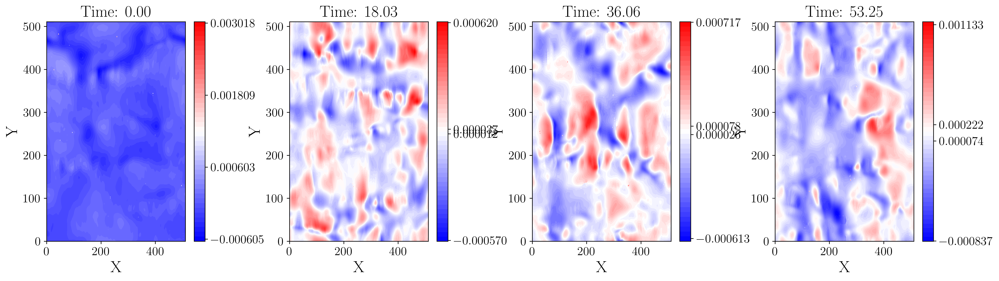

In [24]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5), gridspec_kw={'wspace': 0.4})
time_steps = [0, 577, 1154, 1704]

for i, t in enumerate(time_steps):
    ax = axes[i]

    data_min = np.min(pressure_series[t, :, :])
    data_max = np.max(pressure_series[t, :, :])
    
    contour = ax.contourf(pressure_series[t, :, :], levels=50, cmap='bwr')
    ax.set_title(f'Time: {(time[t]-tstart) * omegap / (2 * np.pi):.2f}', fontsize=20)
    ax.set_xlabel('X', fontsize=20)
    ax.set_ylabel('Y', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=15)
    
    ticks = [data_min, (data_min + data_max) / 4, (data_min + data_max) * 3 / 4, data_max]

    cbar = fig.colorbar(contour, ax=ax, ticks=ticks)
    cbar.ax.tick_params(labelsize=15)

plt.show()

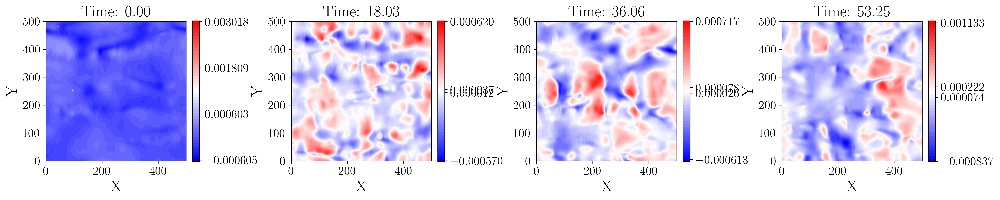

In [25]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5), gridspec_kw={'wspace': 0.6})

for i, t in enumerate(time_steps):
    ax = axes[i]

    data_min = np.min(pressure_series[t, :, :])
    data_max = np.max(pressure_series[t, :, :])
    

    contour = ax.contourf(pressure_series[t, :, :], levels=50, cmap='bwr', vmin=data_min, vmax=data_max)
    ax.set_title(f'Time: {(time[t]-tstart) * omegap / (2 * np.pi):.2f}', fontsize=20)
    ax.set_xlabel('X', fontsize=20)
    ax.set_ylabel('Y', fontsize=20)
    ax.set_xlim([0, 500])
    ax.set_ylim([0, 500])
    ax.set_aspect('equal') 
    ax.tick_params(axis='both', which='major', labelsize=15)
    
    ticks = [data_min, (data_min + data_max) / 4, (data_min + data_max) * 3 / 4, data_max]
    
    cbar = fig.colorbar(contour, ax=ax, ticks=ticks, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=15)

plt.show()


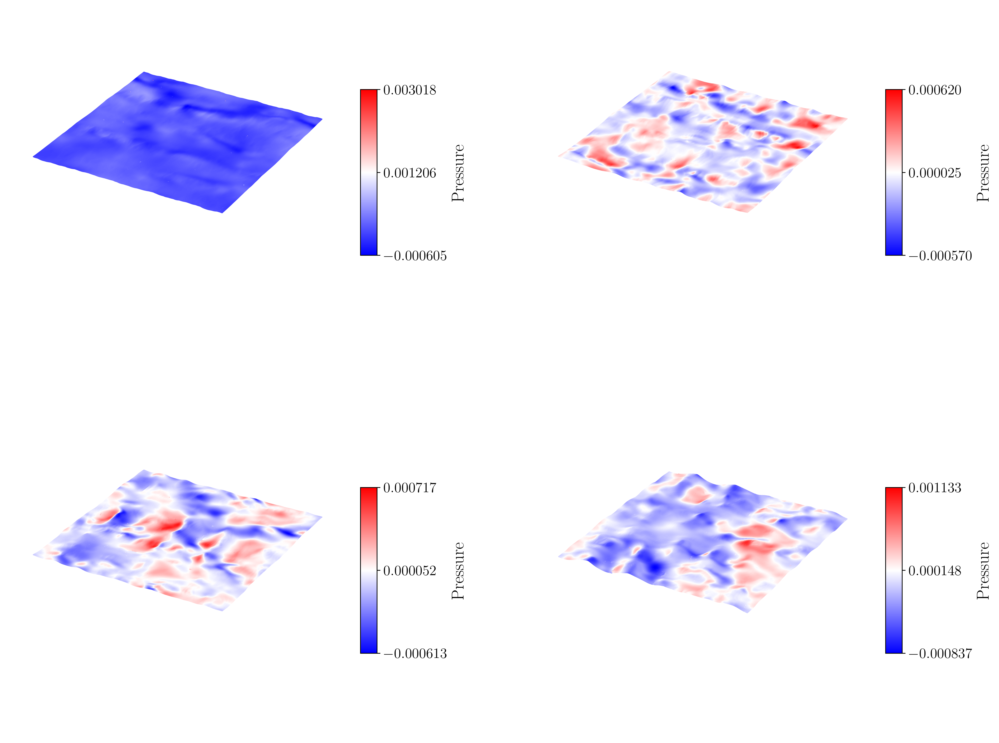

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import math as m

time_steps = [0, 577, 1154, 1704] 

fig = plt.figure(figsize=(18, 14))

for i, t in enumerate(time_steps):
    pressure_data = pressure_series[t, :, :]
    eta_data = eta_series[t, :, :]

    x = np.arange(pressure_data.shape[1])
    y = np.arange(pressure_data.shape[0])
    X, Y = np.meshgrid(x, y)

    ax = fig.add_subplot(2, 2, i + 1, projection='3d')

    norm_pressure = (pressure_data - np.min(pressure_data)) / (np.max(pressure_data) - np.min(pressure_data))
    surf = ax.plot_surface(X, Y, eta_data, facecolors=plt.cm.bwr(norm_pressure), rstride=1, cstride=1, antialiased=True, shade=False)

    ax.set_xlim(0, 500)
    ax.set_ylim(0, 500)
    ax.set_zlim(-0.3, 1.5)
    ax.set_axis_off()  

    data_min = np.min(pressure_data)
    data_max = np.max(pressure_data)
    data_mid = (data_min + data_max) / 2  

    mappable = plt.cm.ScalarMappable(cmap='bwr')
    mappable.set_array(pressure_data)
    cbar = fig.colorbar(mappable, ax=ax, shrink=0.5, aspect=10, pad=0.05)  
    cbar.set_ticks([data_min, data_mid, data_max]) 
    cbar.ax.tick_params(labelsize=15)
    cbar.set_label('Pressure', fontsize=18)


plt.subplots_adjust(wspace=0.2, hspace=0.2)  
plt.show()


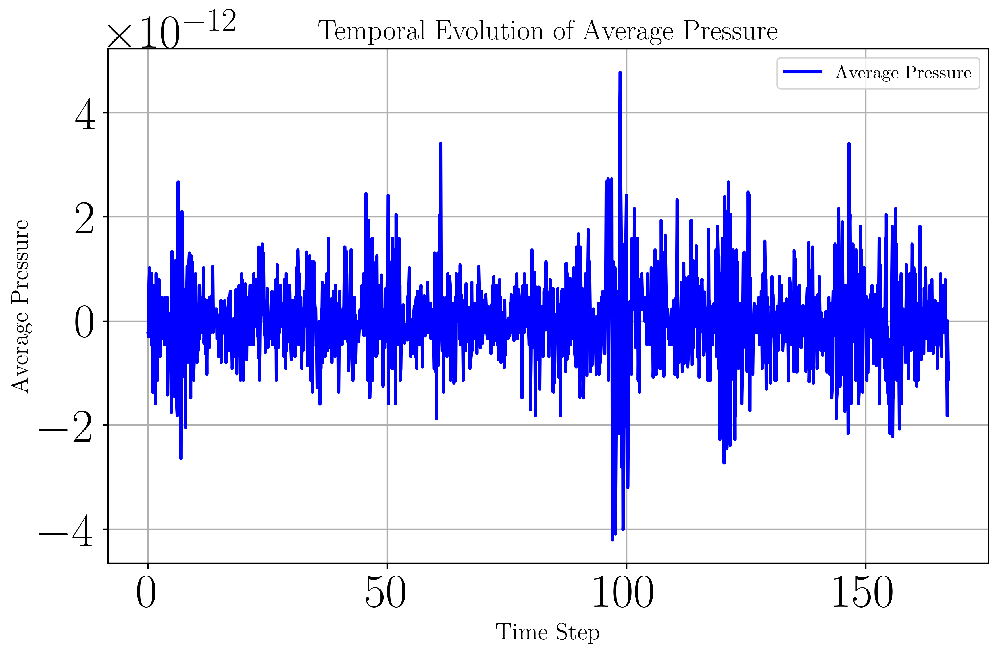

In [36]:
import numpy as np
import matplotlib.pyplot as plt

pressure_time_avg = []

for t in range(pressure_series.shape[0]):
    avg_pressure = np.mean(pressure_series[t, :, :])
    pressure_time_avg.append(avg_pressure)


pressure_time_avg = np.array(pressure_time_avg)

plt.figure(figsize=(10, 6))
plt.plot(time-time[0], pressure_time_avg, label='Average Pressure', color='b', linewidth=2)
plt.xlabel('Time Step', fontsize=15)
plt.ylabel('Average Pressure', fontsize=15)
plt.title('Temporal Evolution of Average Pressure', fontsize=18)
plt.legend()
plt.grid(True)
plt.show()


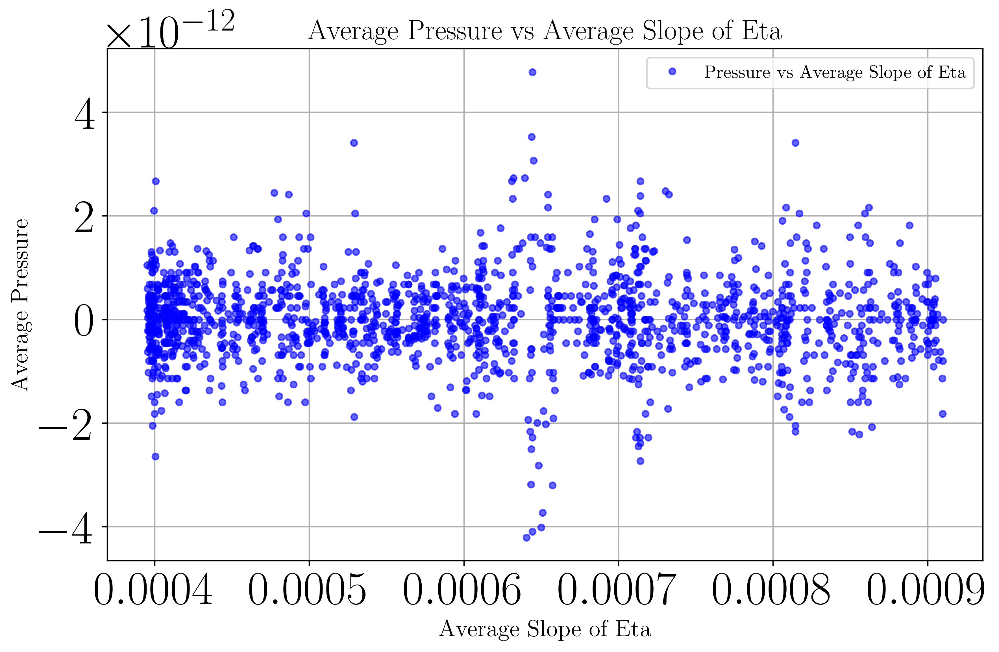

In [37]:
import numpy as np
import matplotlib.pyplot as plt

pressure_time_avg = []
eta_slope_avg = []

for t in range(pressure_series.shape[0]):
    avg_pressure = np.mean(pressure_series[t, :, :])
    pressure_time_avg.append(avg_pressure)

    eta_x_slope = np.gradient(eta_series[t, :, :], axis=1)
    eta_y_slope = np.gradient(eta_series[t, :, :], axis=0) 
    
    eta_slope_magnitude = np.sqrt(eta_x_slope**2 + eta_y_slope**2)
    
    avg_eta_slope = np.mean(eta_slope_magnitude)
    eta_slope_avg.append(avg_eta_slope)

pressure_time_avg = np.array(pressure_time_avg)
eta_slope_avg = np.array(eta_slope_avg)

plt.figure(figsize=(10, 6))
plt.plot(eta_slope_avg, pressure_time_avg, 'o', markersize=4, color='b', alpha=0.6, label='Pressure vs Average Slope of Eta')
plt.xlabel('Average Slope of Eta', fontsize=15)
plt.ylabel('Average Pressure', fontsize=15)
plt.title('Average Pressure vs Average Slope of Eta', fontsize=18)
plt.grid(True)
plt.legend()
plt.show()


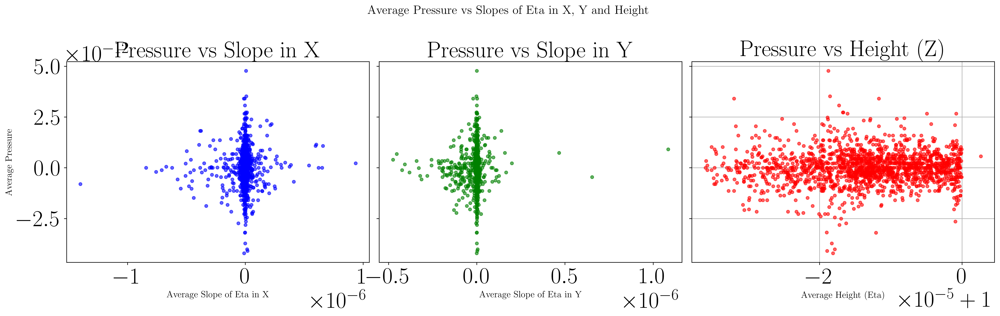

In [38]:
import numpy as np
import matplotlib.pyplot as plt

pressure_time_avg = []
eta_slope_x_avg = []
eta_slope_y_avg = []
eta_slope_z_avg = []

for t in range(pressure_series.shape[0]):
    avg_pressure = np.mean(pressure_series[t, :, :])
    pressure_time_avg.append(avg_pressure)

    eta_x_slope = np.gradient(eta_series[t, :, :], axis=1) 
    eta_y_slope = np.gradient(eta_series[t, :, :], axis=0)
    
    avg_eta_slope_x = np.mean(eta_x_slope)
    avg_eta_slope_y = np.mean(eta_y_slope)

    avg_eta_slope_z = np.mean(eta_series[t, :, :])

    eta_slope_x_avg.append(avg_eta_slope_x)
    eta_slope_y_avg.append(avg_eta_slope_y)
    eta_slope_z_avg.append(avg_eta_slope_z)

pressure_time_avg = np.array(pressure_time_avg)
eta_slope_x_avg = np.array(eta_slope_x_avg)
eta_slope_y_avg = np.array(eta_slope_y_avg)
eta_slope_z_avg = np.array(eta_slope_z_avg)

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

axs[0].plot(eta_slope_x_avg, pressure_time_avg, 'o', markersize=4, color='b', alpha=0.6)
axs[0].set_xlabel('Average Slope of Eta in X', fontsize=12)
axs[0].set_ylabel('Average Pressure', fontsize=12)
axs[0].set_title('Pressure vs Slope in X')

axs[1].plot(eta_slope_y_avg, pressure_time_avg, 'o', markersize=4, color='g', alpha=0.6)
axs[1].set_xlabel('Average Slope of Eta in Y', fontsize=12)
axs[1].set_title('Pressure vs Slope in Y')

axs[2].plot(eta_slope_z_avg, pressure_time_avg, 'o', markersize=4, color='r', alpha=0.6)
axs[2].set_xlabel('Average Height (Eta)', fontsize=12)
axs[2].set_title('Pressure vs Height (Z)')

plt.suptitle('Average Pressure vs Slopes of Eta in X, Y and Height', fontsize=16)
plt.grid(True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Correlation between Pressure and Slope in X: 0.0493 (p-value: 4.1602e-02)
Correlation between Pressure and Slope in Y: 0.0437 (p-value: 7.1211e-02)
Correlation between Pressure and Height (Z): 0.0427 (p-value: 7.8242e-02)


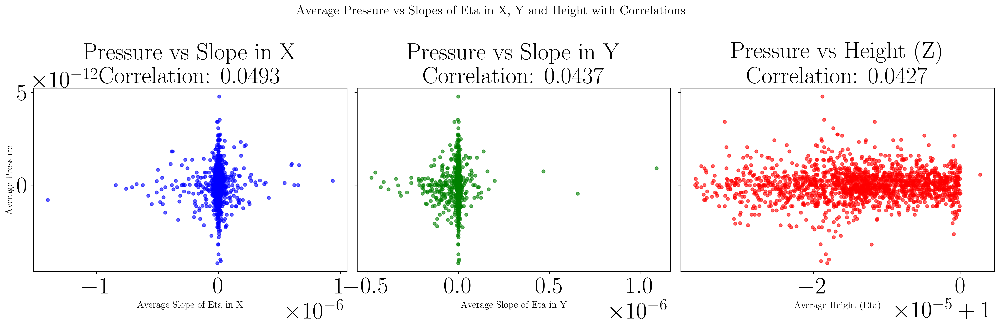

In [39]:
from scipy.stats import pearsonr

corr_x, p_value_x = pearsonr(eta_slope_x_avg, pressure_time_avg)
corr_y, p_value_y = pearsonr(eta_slope_y_avg, pressure_time_avg)
corr_z, p_value_z = pearsonr(eta_slope_z_avg, pressure_time_avg)


print(f"Correlation between Pressure and Slope in X: {corr_x:.4f} (p-value: {p_value_x:.4e})")
print(f"Correlation between Pressure and Slope in Y: {corr_y:.4f} (p-value: {p_value_y:.4e})")
print(f"Correlation between Pressure and Height (Z): {corr_z:.4f} (p-value: {p_value_z:.4e})")

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

axs[0].plot(eta_slope_x_avg, pressure_time_avg, 'o', markersize=4, color='b', alpha=0.6)
axs[0].set_xlabel('Average Slope of Eta in X', fontsize=12)
axs[0].set_ylabel('Average Pressure', fontsize=12)
axs[0].set_title(f'Pressure vs Slope in X\nCorrelation: {corr_x:.4f}')

axs[1].plot(eta_slope_y_avg, pressure_time_avg, 'o', markersize=4, color='g', alpha=0.6)
axs[1].set_xlabel('Average Slope of Eta in Y', fontsize=12)
axs[1].set_title(f'Pressure vs Slope in Y\nCorrelation: {corr_y:.4f}')

axs[2].plot(eta_slope_z_avg, pressure_time_avg, 'o', markersize=4, color='r', alpha=0.6)
axs[2].set_xlabel('Average Height (Eta)', fontsize=12)
axs[2].set_title(f'Pressure vs Height (Z)\nCorrelation: {corr_z:.4f}')

plt.suptitle('Average Pressure vs Slopes of Eta in X, Y and Height with Correlations', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


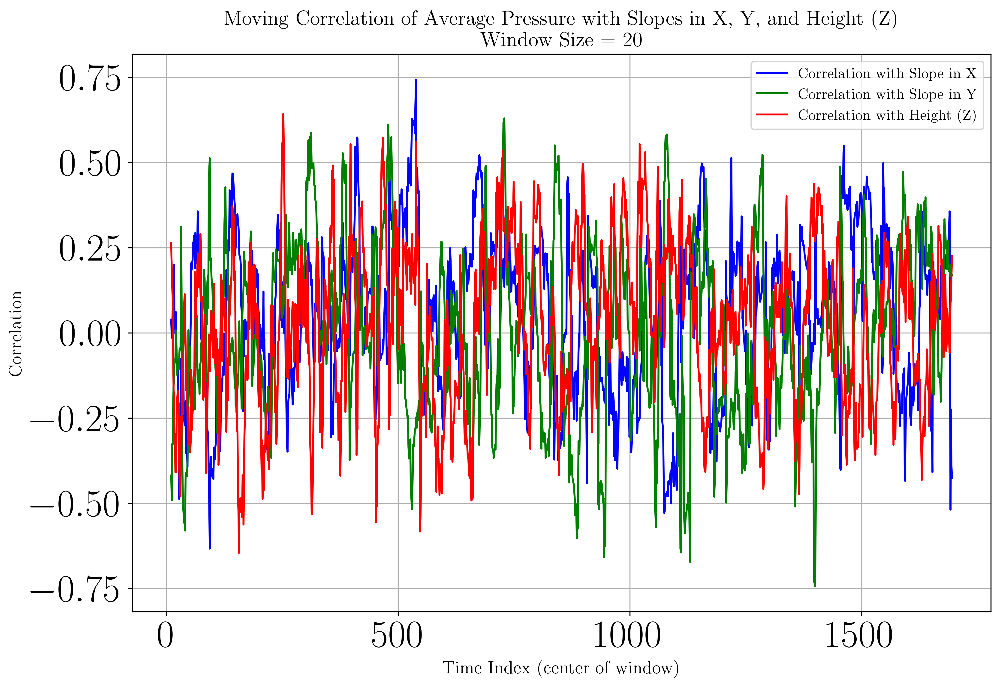

In [40]:
from scipy.stats import pearsonr
import numpy as np
import matplotlib.pyplot as plt

window_size = 20

correlations_x = []
correlations_y = []
correlations_z = []
time_indices = []

for i in range(len(pressure_time_avg) - window_size + 1):
    window_pressure = pressure_time_avg[i:i + window_size]
    window_slope_x = eta_slope_x_avg[i:i + window_size]
    window_slope_y = eta_slope_y_avg[i:i + window_size]
    window_slope_z = eta_slope_z_avg[i:i + window_size]

    corr_x, _ = pearsonr(window_slope_x, window_pressure)
    corr_y, _ = pearsonr(window_slope_y, window_pressure)
    corr_z, _ = pearsonr(window_slope_z, window_pressure)

    correlations_x.append(corr_x)
    correlations_y.append(corr_y)
    correlations_z.append(corr_z)
    time_indices.append(i + window_size // 2)

plt.figure(figsize=(12, 8))
plt.plot(time_indices, correlations_x, label='Correlation with Slope in X', color='b')
plt.plot(time_indices, correlations_y, label='Correlation with Slope in Y', color='g')
plt.plot(time_indices, correlations_z, label='Correlation with Height (Z)', color='r')
plt.xlabel('Time Index (center of window)', fontsize=14)
plt.ylabel('Correlation', fontsize=14)
plt.title(f'Moving Correlation of Average Pressure with Slopes in X, Y, and Height (Z)\nWindow Size = {window_size}', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()


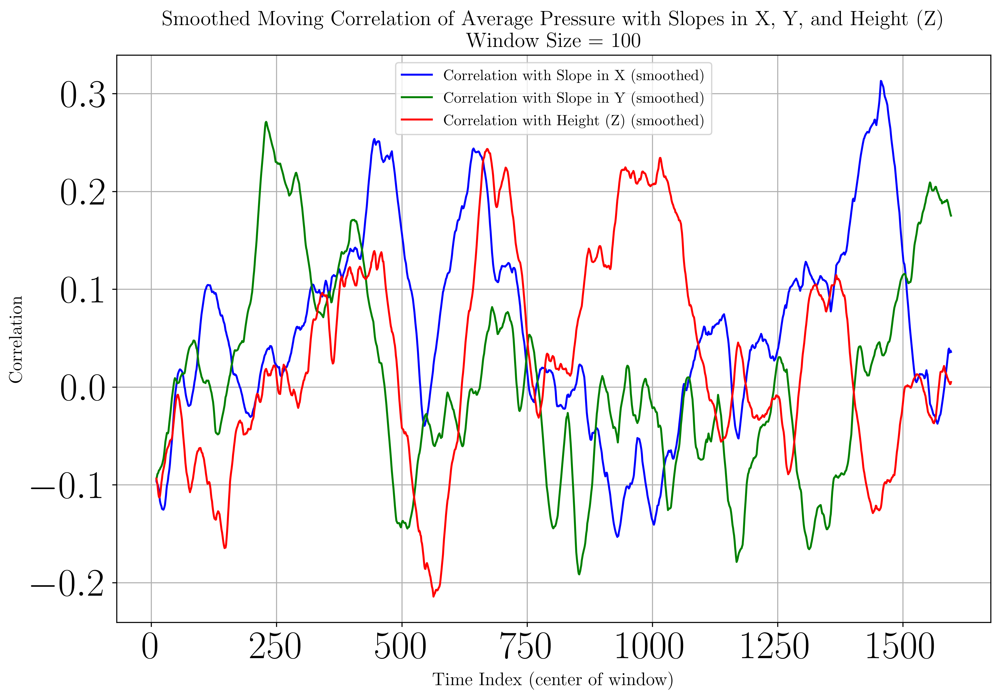

In [47]:
window_size = 100

def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

smoothed_corr_x = moving_average(correlations_x, 100)
smoothed_corr_y = moving_average(correlations_y, 100)
smoothed_corr_z = moving_average(correlations_z, 100)
smoothed_time_indices = time_indices[:len(smoothed_corr_x)]

plt.figure(figsize=(12, 8))
plt.plot(smoothed_time_indices, smoothed_corr_x, label='Correlation with Slope in X (smoothed)', color='b')
plt.plot(smoothed_time_indices, smoothed_corr_y, label='Correlation with Slope in Y (smoothed)', color='g')
plt.plot(smoothed_time_indices, smoothed_corr_z, label='Correlation with Height (Z) (smoothed)', color='r')
plt.xlabel('Time Index (center of window)', fontsize=14)
plt.ylabel('Correlation', fontsize=14)
plt.title(f'Stmoothed Moving Correlation of Average Pressure with Slopes in X, Y, and Height (Z)\nWindow Size = {window_size}', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()
